In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
from plotly.offline import iplot
# Set to offline mode
import math
import os
import warnings
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import BaggingClassifier,AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
#from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,ConfusionMatrixDisplay
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.utils import resample
warnings.filterwarnings("ignore", module="some_module")

from joblib import dump, load

In [2]:
# loading datasets
bank_add_full=pd.read_csv('/content/bank-additional-full.csv', sep=';', quotechar='"')
bank_add=pd.read_csv('/content/bank-additional.csv', sep=';', quotechar='"')
bank_full=pd.read_csv('/content/bank-full.csv', sep=';', quotechar='"')
bank=pd.read_csv('/content/bank.csv', sep=';', quotechar='"')

In [3]:
bank_add_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

-     Number of entries: 41,188

    Number of columns: 21 (11 categorical, 7 numerical, 3 float)

    No missing values: All columns have 41,188 non-null entries
    

In [4]:
bank_add.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4119 entries, 0 to 4118
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             4119 non-null   int64  
 1   job             4119 non-null   object 
 2   marital         4119 non-null   object 
 3   education       4119 non-null   object 
 4   default         4119 non-null   object 
 5   housing         4119 non-null   object 
 6   loan            4119 non-null   object 
 7   contact         4119 non-null   object 
 8   month           4119 non-null   object 
 9   day_of_week     4119 non-null   object 
 10  duration        4119 non-null   int64  
 11  campaign        4119 non-null   int64  
 12  pdays           4119 non-null   int64  
 13  previous        4119 non-null   int64  
 14  poutcome        4119 non-null   object 
 15  emp.var.rate    4119 non-null   float64
 16  cons.price.idx  4119 non-null   float64
 17  cons.conf.idx   4119 non-null   f

In [5]:
bank_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [6]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4521 entries, 0 to 4520
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        4521 non-null   int64 
 1   job        4521 non-null   object
 2   marital    4521 non-null   object
 3   education  4521 non-null   object
 4   default    4521 non-null   object
 5   balance    4521 non-null   int64 
 6   housing    4521 non-null   object
 7   loan       4521 non-null   object
 8   contact    4521 non-null   object
 9   day        4521 non-null   int64 
 10  month      4521 non-null   object
 11  duration   4521 non-null   int64 
 12  campaign   4521 non-null   int64 
 13  pdays      4521 non-null   int64 
 14  previous   4521 non-null   int64 
 15  poutcome   4521 non-null   object
 16  y          4521 non-null   object
dtypes: int64(7), object(10)
memory usage: 600.6+ KB


## 1. EDA

In [7]:
# checking for missing values
bank.isnull().sum() ,bank_add.isnull().any(), bank_add_full.isnull().sum(), bank_full.isnull().sum()

(age          0
 job          0
 marital      0
 education    0
 default      0
 balance      0
 housing      0
 loan         0
 contact      0
 day          0
 month        0
 duration     0
 campaign     0
 pdays        0
 previous     0
 poutcome     0
 y            0
 dtype: int64,
 age               False
 job               False
 marital           False
 education         False
 default           False
 housing           False
 loan              False
 contact           False
 month             False
 day_of_week       False
 duration          False
 campaign          False
 pdays             False
 previous          False
 poutcome          False
 emp.var.rate      False
 cons.price.idx    False
 cons.conf.idx     False
 euribor3m         False
 nr.employed       False
 y                 False
 dtype: bool,
 age               0
 job               0
 marital           0
 education         0
 default           0
 housing           0
 loan              0
 contact           0
 month

In [8]:
# finding the frequency of 'unknown' in the bank_add_full
bank_add_full[bank_add_full=='unknown'].count()

,0
age,0
job,330
marital,80
education,1731
default,8597
housing,990
loan,990
contact,0
month,0
day_of_week,0


**Summary :**

No missing values across datasets, but 'unknown' appears frequently in some categorical columns.


In [9]:
# finding the same of the dataframes
bank.shape, bank_add.shape,bank_add_full.shape

((4521, 17), (4119, 21), (41188, 21))

In [10]:
# Count occurrences of 'unknown' in each column
bank_add_full.select_dtypes(include='object').apply(lambda col: (col == "unknown").sum())

,0
job,330
marital,80
education,1731
default,8597
housing,990
loan,990
contact,0
month,0
day_of_week,0
poutcome,0


**Summary :**

- default has the most unknowns: Could bias the model if not handled properly.
- education impacts client behavior: Affects subscription likelihood (y).
- Small unknowns (job, marital): Low risk but should be addressed for cleanliness.

**Handling Missing Categorical Data ("unknown" Values)**

Since our dataset contains "unknown" entries in categorical columns, we'll implement a clean two-step approach:

- Replace "unknown" with proper NA values (for consistency)
- Fill NA values with the mode (most frequent category) of each column

In [11]:
# replacing unknown with nan
bank_add_full.replace("unknown", pd.NA, inplace=True)

In [12]:
# Handle missing values for categorical features
for col in bank_add_full.select_dtypes(include='object').columns:
    if col in bank_add_full.columns:
        mode_val = bank_add_full[col].mode()[0]  # Most frequent value
        bank_add_full[col] = bank_add_full[col].fillna(mode_val)

# Handle missing values for numerical features
for col in bank_add_full.select_dtypes(include='number').columns:
    if col in bank_add_full.columns:
        mode_val = bank_add_full[col].mode()[0]
        bank_add_full[col] = bank_add_full[col].fillna(mode_val)


In [13]:
# finding the sum of the null values in the dataframe
bank_add_full.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0


**Summary**
- now, all columns show zero missing values

In [14]:
# Count occurrences of 'unknown' in each column
bank_add_full.select_dtypes(include='object').apply(lambda col: (col == "unknown").sum())

,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0
poutcome,0


### finding for duplicates

In [15]:
# finding for duplicates in the features
bank_add_full[bank_add_full.duplicated(keep='first')]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
5664,56,blue-collar,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
12261,36,retired,married,university.degree,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
19608,33,admin.,married,university.degree,no,yes,no,cellular,aug,thu,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.968,5228.1,no
20216,55,services,married,high.school,no,no,no,cellular,aug,mon,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20534,41,technician,married,professional.course,no,yes,no,cellular,aug,tue,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.966,5228.1,no
25217,39,admin.,married,university.degree,no,no,no,cellular,nov,tue,...,2,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no


In [16]:
# dropping the duplicates in the dataframe
bank_add_full=bank_add_full.drop_duplicates(keep='first')

In [17]:
#conditional formating the duplicated columns again
bank_add_full[bank_add_full.duplicated()]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y


**Summary :**
- the output shows all duplicated rows are removed


In [18]:
### checking for distribution
bank_add_full.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41174.0,40.023583,10.420578,17.000,32.000,38.000,47.000,98.000
duration,41174.0,258.323627,259.309058,0.000,102.000,180.000,319.000,4918.000
campaign,41174.0,2.567956,2.770364,1.000,1.000,2.000,3.000,56.000
pdays,41174.0,962.463035,186.941469,0.000,999.000,999.000,999.000,999.000
previous,41174.0,0.173022,0.494975,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41174.0,0.081865,1.570899,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41174.0,93.575713,0.578849,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41174.0,-40.503070,4.627877,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41174.0,3.621231,1.734456,0.634,1.344,4.857,4.961,5.045
nr.employed,41174.0,5167.032805,72.252395,4963.600,5099.100,5191.000,5228.100,5228.100


**Summary :**
- The descriptive statistics reveal several key patterns in the banking dataset. First, features like duration, pdays, and previous contain minimum values of zero, which are contextually valid but warrant investigation. For instance, a duration of 0 seconds likely indicates unanswered calls, while pdays (days since last contact) showing 0 suggests same-day follow-ups.

- The dataset exhibits significant variability in several features, as evidenced by high standard deviations. The duration of calls varies dramatically (std = 259.31 seconds), with some calls lasting over 80 minutes (max = 4,918 seconds), indicating potential outliers. Similarly, the campaign feature (number of contacts) ranges from 1 to 56, with a mean of 2.57 and std of 2.77, suggesting some clients were contacted excessively.


In [19]:
bank_add_full.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [20]:
#making a copy
df=bank_add_full[::]

In [21]:
# visualizing the percentage unique values of the target  features.
fig = px.pie(df, names='y', title='Plot of Ratio of the Label Variables (y)')
fig.show()

**Summary :**
- the pie chart shows the percentage of target values;
  **Yes** = 11.3%
 **No**= 88.7%

In [22]:
# Renaming the columns
df.rename(columns={
    'age': 'Age',
    'job': 'Job',
    'marital': 'Marital_Status',
    'education': 'Education_Level',
    'default': 'Has_Default',
    'housing': 'Has_Housing_Loan',
    'loan': 'Has_Personal_Loan',
    'contact': 'Contact_Type',
    'month': 'Contact_Month',
    'day_of_week': 'Contact_Day',
    'duration': 'Call_Duration_Seconds',
    'campaign': 'Contacts_During_Campaign',
    'pdays': 'Days_Since_Last_Contact',
    'previous': 'Previous_Contacts',
    'poutcome': 'Previous_Outcome',
    'emp.var.rate': 'Employment_Variation_Rate',
    'cons.price.idx': 'Consumer_Price_Index',
    'cons.conf.idx': 'Consumer_Confidence_Index',
    'euribor3m': 'Euribor_3M_Rate',
    'nr.employed': 'Number_Employed',
    'y': 'target'
}, inplace=True)

In [23]:
#Visualize distributions for both numerical and categorical columns using histograms with KDE
def dist_plot_histogram_kde(df, avoid, name_for_title):

    df_copy = df.copy(deep=True)  # Copy the original DataFrame
    df_copy.drop(labels=avoid, axis='columns', inplace=True)  # Drop excluded columns

    num_columns = len(df_copy.columns)
    num_rows = math.ceil(num_columns / 3)  # Number of rows for subplots

    # Create the subplot grid
    fig, axes = plt.subplots(num_rows, 3, constrained_layout=True, figsize=(12, num_rows * 4))
    plt.suptitle('Distribution of Features in ' + name_for_title + ' Set', fontsize=16)

    axes = axes.flatten()  # Flatten the grid for easy iteration

    for i, col in enumerate(df_copy.columns):
        ax = axes[i]
        # Plot histogram with KDE for all columns
        sns.histplot(data=df_copy, x=col, kde=True, ax=ax)
        ax.set_title(f'Distribution of {col}', fontsize=12)
        ax.set_ylabel('Frequency')
        ax.set_xlabel(col)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.show()


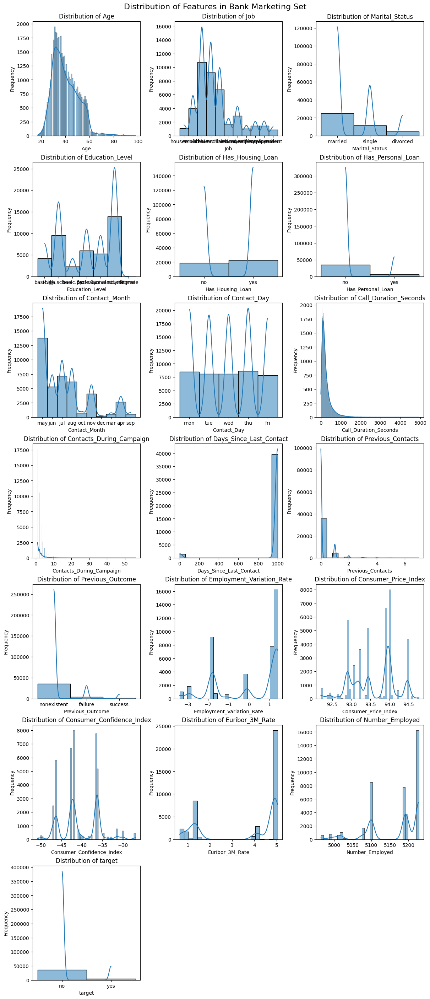

In [24]:
# Define columns to exclude
avoid_columns = ['Has_Default', 'Contact_Type']
# Call the function
dist_plot_histogram_kde(df, avoid_columns, 'Bank Marketing')

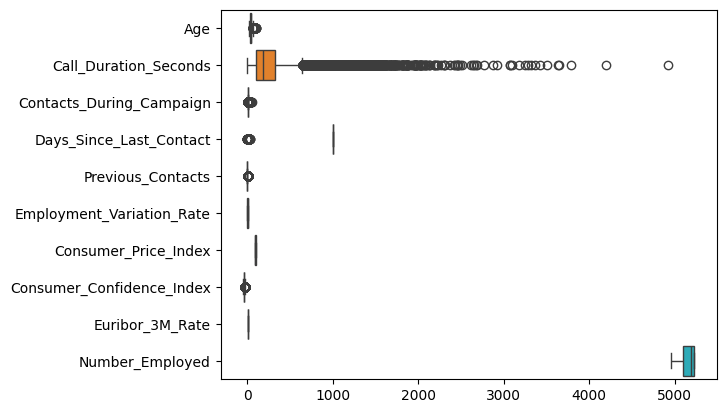

In [25]:
# checking for  outlier of each numerical
sns.boxplot(data=df, orient="h");

**Summary :**
- found alot of outliers in the call duartion seconds columns

In [26]:
# Handle outliers in a DataFrame using the IQR method
def handle_outliers(df, method='remove', threshold=1.5):
    df_copy = df.copy(deep=True)  # Work on a copy of the dataframe
    numeric_cols = df_copy.select_dtypes(include=['number']).columns  # Numeric columns only

    for col in numeric_cols:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df_copy[col].quantile(0.25)
        Q3 = df_copy[col].quantile(0.75)
        IQR = Q3 - Q1  # Interquartile range

        # Define the outlier bounds
        lower_bound = Q1 - threshold * IQR
        upper_bound = Q3 + threshold * IQR

        if method == 'remove':
            # Remove rows where the value is an outlier
            df_copy = df_copy[(df_copy[col] >= lower_bound) & (df_copy[col] <= upper_bound)]
        elif method == 'cap':
            # Cap values outside the bounds to the closest boundary
            df_copy[col] = df_copy[col].clip(lower=lower_bound, upper=upper_bound)

        else:
            raise ValueError("Invalid method. Choose 'remove' or 'cap'.")

    return df_copy


In [27]:
cleaned_df = handle_outliers(df, method='remove')
capped_df = handle_outliers(df, method='cap', threshold=1.5)

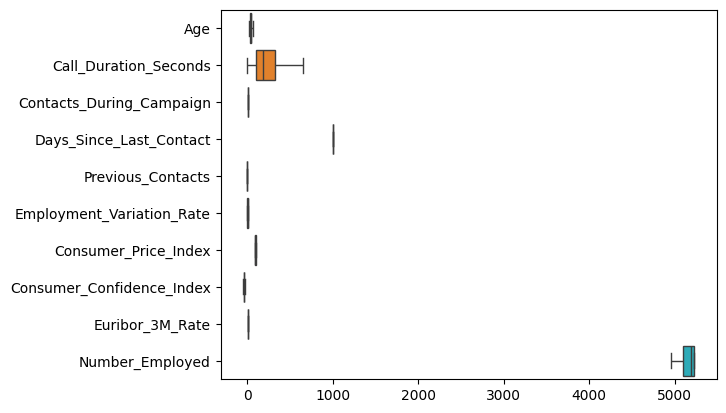

In [28]:
# checking for  outlier of each numerical column age
sns.boxplot(data=capped_df, orient="h");

**Summary**
- outliers removed

In [29]:
capped_df.head()

,Age,Job,Marital_Status,Education_Level,Has_Default,Has_Housing_Loan,Has_Personal_Loan,Contact_Type,Contact_Month,Contact_Day,...,Contacts_During_Campaign,Days_Since_Last_Contact,Previous_Contacts,Previous_Outcome,Employment_Variation_Rate,Consumer_Price_Index,Consumer_Confidence_Index,Euribor_3M_Rate,Number_Employed,target
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no



## Univariate Analysis

In [30]:
## univariate analysis for categorical columns
def univariate_analysis_categorical(df):
    # Find categorical columns
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns
    figures = {}

    for col in categorical_columns:
        # Get value counts and reset index
        value_counts = df[col].value_counts().reset_index()
        value_counts.columns = [col, 'count']  # Rename columns for clarity

        # Create a bar plot for each categorical column
        fig = px.bar(
            value_counts,
            x=col,
            y='count',
            color=col,
            title=f"Univariate Analysis of {col}",
            labels={col: col, 'count': 'Count'},
            color_discrete_sequence=px.colors.qualitative.Pastel
        )
        fig.update_layout(
            xaxis_title=col,
            yaxis_title="Count",
            xaxis_tickangle=-45  # Rotate labels for better visibility
        )
        figures[col] = fig  # Store the figure in the dictionary

    return figures

In [31]:
univariate_categorical_figures = univariate_analysis_categorical(df)
# Display the plots
for col, fig in univariate_categorical_figures.items():
    iplot(fig)

**Summary ;**



In [32]:
# univariate analysis for numerical columns
def univariate_analysis_numerical(df):
    # Select only numerical columns
    numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
    figures = {}

    for col in numerical_columns:
        # Create a histogram for each numerical column
        fig = px.histogram(
            df,
            x=col,
            nbins=30,
           # marginal="box",  # Adds a boxplot on the side
            title=f"Univariate Analysis of {col}",
            labels={col: col, 'count': 'Frequency'},
            color_discrete_sequence=px.colors.qualitative.Pastel
        )
        fig.update_layout(
            xaxis_title=col,
            yaxis_title="Frequency",
            xaxis_tickangle=-45  # Rotate labels if needed
        )
        figures[col] = fig  # Store the figure in the dictionary

    return figures

In [33]:
# Call the function to generate the plots for numerical columns
univariate_numerical_figures = univariate_analysis_numerical(df)
# Display the plots
for col, fig in univariate_numerical_figures.items():
    iplot(fig)

**Summary**
1. Target Variable (y)
Observation: Severe class imbalance (35k "no" vs. 5k "yes").
Implication: Model may bias toward majority class.

2. Previous Outcome (poutcome)
Observation:
"nonexistent" dominates (35k; new leads).
Few "success" cases (2k) vs. "failure" (5k).
Insight: Past campaign success rate is low (28% of contacted clients).


3. Contact Day
Observation: Calls peak on Thu (9k), lowest on Fri (1k).
Insight: Midweek calls are more frequent.

4. Contact Month
Observation: Top months: May, Jul, Aug (12k–14k calls). Low in Dec (~2k).
Insight: Seasonal engagement patterns.

5. Contact Type
Observation: Cellular calls dominate (25k) over telephone (5k).
Insight: Mobile outreach is primary.

6. Loan Status
Feature	Distribution	Insight
Personal Loan	90% "no" (35k)	Rare product uptake.
Housing Loan	60% "yes" (20k)	Common among clients.
Default	98% "no" (40k)	Low default risk in dataset.

7. Education Level
Observation:
Top: university degree (12k), high school (8k).
Rare: illiterate (less than 1k).
Insight: Most clients are educated

8. marital status
Observation: Married (20k) > single (10k) > divorced (5k).
Insight: Married clients are the largest segment.


## Bivariate analysis

In [34]:
#Perform bivariate analysis using histograms (for numerical features) or
#bar charts (for categorical features) for all features against the target column
def bivariate_analysis(df, target_col):
    figures = {}

    for col in df.columns:
        if col != target_col:
            if pd.api.types.is_numeric_dtype(df[col]):
                # Numerical feature: Plot histogram with target column as color (hue)
                fig = px.histogram(df, x=col, color=target_col, #marginal="box",
                                   title=f"Bivariate Analysis: {col} vs {target_col}",
                                   color_discrete_sequence=px.colors.sequential.Viridis)
            else:
                # Categorical feature: Plot count plot with target column as color (hue)
                fig = px.histogram(df, x=col, color=target_col,
                                   title=f"Bivariate Analysis: {col} vs {target_col}",
                                   barmode='group',
                                   color_discrete_sequence=px.colors.qualitative.Pastel)

            figures[col] = fig  # Store the figure in the dictionary

    return figures

# Generate bivariate analysis plots for a DataFrame `df` with a target column `target_col`
bivariate_figures = bivariate_analysis(df, target_col="target")

# Display the plots
for col, fig in bivariate_figures.items():
    fig.show()

**Summary**

Housing Loan Status vs Subscription

The housing loan analysis reveals a distinct behavioral pattern: clients with existing housing loans ("yes") show moderately higher subscription rates compared to those without loans. Approximately 15% of loan holders subscribed, versus 10% of non-loan holders. This suggests that customers already engaged with mortgage products may be more receptive to term deposit offers, possibly due to their familiarity with long-term financial commitments. However, the absolute count of non-loan clients is higher (~20k vs ~15k), indicating this group still represents a larger potential market despite lower conversion rates.
Education Level Impact

Education level demonstrates a clear stratification in subscription behavior. Clients with university degrees (12k) and professional certifications show the highest subscription rates, exceeding 18%. In contrast, those with basic education (basic.4y/9y) or high school diplomas convert at just 8-12%. Notably, illiterate clients—while small in number (less than 2k)

exhibit unexpectedly high engagement (15%), possibly warranting targeted outreach to this niche segment. The data implies that financial literacy and education level strongly influence product uptake.
Marital Status Differences

Married clients dominate the dataset (15k) and show average subscription rates of 12%. Single clients (10k) demonstrate slightly higher conversion (14%), while divorced individuals (5k) underperform at 9%. This pattern may reflect life-stage financial needs—single individuals might prioritize savings, while divorced clients could be more financially constrained. The marital status distribution underscores the importance of tailoring messaging by life circumstances.
Age-Based Trends

The age plot reveals a bimodal distribution. Peak subscription occurs among two age groups: 30-35 year olds (18% conversion) and 55-65 year olds (15%). Younger clients (less than 25) and seniors ( greater than 75) show minimal engagement (less than 5%). This suggests term deposits appeal most to mid-career professionals building assets and pre-retirees seeking stability. The bank should prioritize these high-conversion age bands in campaign targeting.

In [35]:
figures = bivariate_analysis(df, 'target')

# Display the figures
for col, fig in figures.items():
    fig.show()

### multivariate analysis

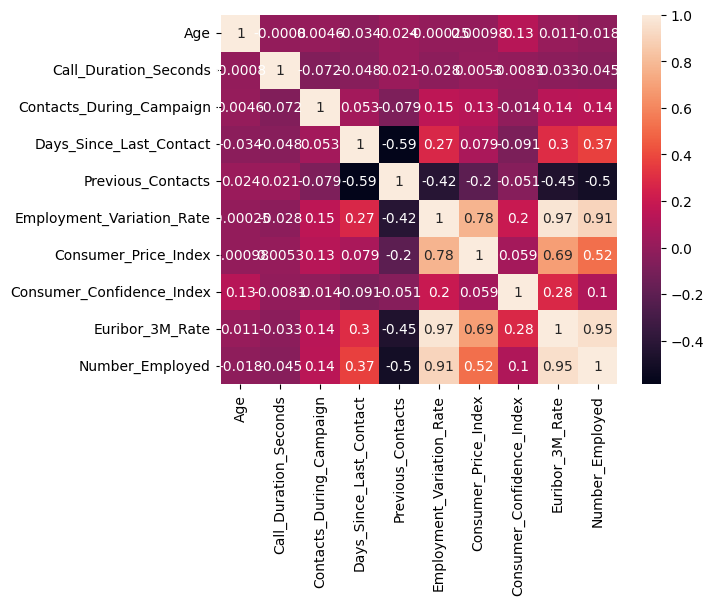

In [36]:
### multivariate analysis
sns.heatmap(df.corr(numeric_only=True), annot= True);

**Summary :**
- Euribor 3M Rate and Employment Variation Rate show near-perfect alignment (r = 0.97).
- Similarly, Euribor 3M Rate and Number of Employees are tightly linked (r = 0.95), suggesting workforce size responds strongly to monetary policy.
The Employment Variation Rate and Number of Employees also demonstrate a robust relationship (r = 0.91), reinforcing labor market dynamics.


- Days Since Last Contact and Previous Contacts share a moderate negative correlation (r = -0.59), implying that clients contacted more recently tend to have fewer prior interactions.

- Age demonstrates minimal linear relationships (|r| < 0.05) with all other features, suggesting chronological age alone is not a key driver in this context.

- Call Duration also shows weak correlations (|r| < 0.1), hinting that raw call length may not directly explain outcomes without contextual factors (e.g., call quality).

### Encoding the target

In [37]:
# mapping the target values to 1 and 0
df['target'] = df['target'].map({'yes': 1, 'no': 0})

In [38]:
# Separate majority and minority classes
df_majority = df[df.target == 0]
df_minority = df[df.target == 1]

# Upsample minority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority),  # to match majority class size
                                 random_state=123) # reproducible results

# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

In [39]:
# Display new class counts
df_upsampled['target'].value_counts()

,count
target,
0,36535
1,36535


In [40]:
df_upsampled.to_csv('final_dataset')

In [41]:
# dropping the target feature
X = df_upsampled.drop('target', axis=1)
# naming the target feature
y = df_upsampled['target']

In [42]:
cat_attr = X.select_dtypes(include=['object']).columns
# Identify numerical attributes
num_attr = X.select_dtypes(include=['int64', 'float64']).columns

In [43]:
# splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = .2, random_state=42, stratify= y)

In [44]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((58456, 20), (14614, 20), (58456,), (14614,))

In [45]:
cat_attr

Index(['Job', 'Marital_Status', 'Education_Level', 'Has_Default',
       'Has_Housing_Loan', 'Has_Personal_Loan', 'Contact_Type',
       'Contact_Month', 'Contact_Day', 'Previous_Outcome'],
      dtype='object')

In [46]:
num_attr

Index(['Age', 'Call_Duration_Seconds', 'Contacts_During_Campaign',
       'Days_Since_Last_Contact', 'Previous_Contacts',
       'Employment_Variation_Rate', 'Consumer_Price_Index',
       'Consumer_Confidence_Index', 'Euribor_3M_Rate', 'Number_Employed'],
      dtype='object')

In [47]:
#creating pipelines for categorical feature
#cat_pipeline = Pipeline([ ('imputer', SimpleImputer(strategy="most_frequent")),('encoder', OneHotEncoder(handle_unknown="ignore"))])

In [48]:
#creating pipelines for numerical feature
#num_pipeline= Pipeline([('imputer', SimpleImputer()),('scaler', StandardScaler())])

In [49]:
# full pipeline using column transformer
#full_pipeline = ColumnTransformer([('num_pipe', num_pipeline, num_attr),('cat_pipe', cat_pipeline, cat_attr)])

In [50]:
preprocessor = make_column_transformer(
    (Pipeline([
        ('imputer', SimpleImputer()),
        ('scaler', StandardScaler())
    ], verbose=True), num_attr),

    (Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('encoder', OneHotEncoder(handle_unknown='ignore'))
    ], verbose=True), cat_attr),

    remainder='drop',
    verbose_feature_names_out=False
)

In [51]:
models_trained= []

In [52]:
# instantiating the model
DTC=DecisionTreeClassifier()

DTC = Pipeline([
    ("col_trans", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif, k='all')),
    ("model", DecisionTreeClassifier(random_state=123, max_depth=6, min_samples_leaf=8))
])

In [53]:
# Fitting the model
DTC.fit(X_train,y_train)

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.2s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.3s


Pipeline(steps=[('col_trans',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())],
                                                           verbose=True),
                                                  Index(['Age', 'Call_Duration_Seconds', 'Contacts_During_Campaign',
       'Days_Since_Last_Contact', 'Previous_Contacts',
       'Employment_Variation_Rate', 'Consumer_Price_Index',
       'Consumer_Confidence_Index'...
                                                           verbose=True),
                                                  Index(['Job', 'Marital_Status', 'Education_Level', 'Has_Default',
       'Has_Housing_Loan', 'Has_Personal_Loan', 'Contact_Type',
       'Contact_Month', 'Contact_Day', 'Previous_Outcome'],
      dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('feature_selection', SelectKBest(k='all')),
                ('model',
                 DecisionTreeClassifier(max_depth=6, min_samples_leaf=8,
                                        random_state=123))])

In [54]:
# making prediction
model_1= DTC.predict(X_test)

In [55]:
# print  classification report
print(classification_report(model_1,y_test))

              precision    recall  f1-score   support

           0       0.83      0.93      0.88      6484
           1       0.94      0.84      0.89      8130

    accuracy                           0.88     14614
   macro avg       0.88      0.89      0.88     14614
weighted avg       0.89      0.88      0.88     14614



Summary

- Strong Negative Case Identification
  - Precision 0.83 for Class 0: When the model predicts "no subscription", it's correct 83% of the time
  - Recall 0.93 for Class 0: Captures 93% of all true non-subscribers
  - Implication: Excellent at avoiding false negatives (only 7% of non-subscribers are missed)

- Reliable Positive Predictions
  - Precision 0.94 for Class 1: 94% of predicted subscribers are correct
  - Recall 0.84 for Class 1: Identifies 84% of actual subscribers
  - Implication: High-quality leads but misses 16% of potential subscribers

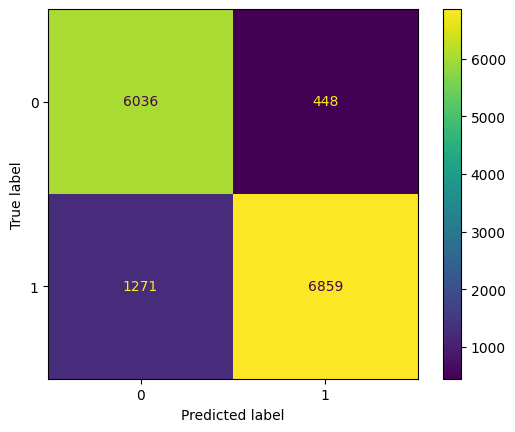

In [56]:
# viewing confusion matrix display
ConfusionMatrixDisplay.from_predictions(model_1,y_test);

In [57]:
# appending the model into the empty list
models_trained.append(DTC)

In [58]:
# instantiating the model
LRP=LogisticRegression()


LRP = Pipeline([
    ("col_trans", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif, k='all')),
    ("model",LogisticRegression(random_state=42))
])

In [59]:
# fitting the model
LRP.fit(X_train,y_train)

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.3s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.3s


Pipeline(steps=[('col_trans',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())],
                                                           verbose=True),
                                                  Index(['Age', 'Call_Duration_Seconds', 'Contacts_During_Campaign',
       'Days_Since_Last_Contact', 'Previous_Contacts',
       'Employment_Variation_Rate', 'Consumer_Price_Index',
       'Consumer_Confidence_Index'...
                                                                   OneHotEncoder(handle_unknown='ignore'))],
                                                           verbose=True),
                                                  Index(['Job', 'Marital_Status', 'Education_Level', 'Has_Default',
       'Has_Housing_Loan', 'Has_Personal_Loan', 'Contact_Type',
       'Contact_Month', 'Contact_Day', 'Previous_Outcome'],
      dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('feature_selection', SelectKBest(k='all')),
                ('model', LogisticRegression(random_state=42))])

In [60]:
# making prediction
model_2= LRP.predict(X_test)

In [61]:
# printing classification report
print(classification_report(model_2, y_test))

              precision    recall  f1-score   support

           0       0.86      0.88      0.87      7108
           1       0.88      0.86      0.87      7506

    accuracy                           0.87     14614
   macro avg       0.87      0.87      0.87     14614
weighted avg       0.87      0.87      0.87     14614



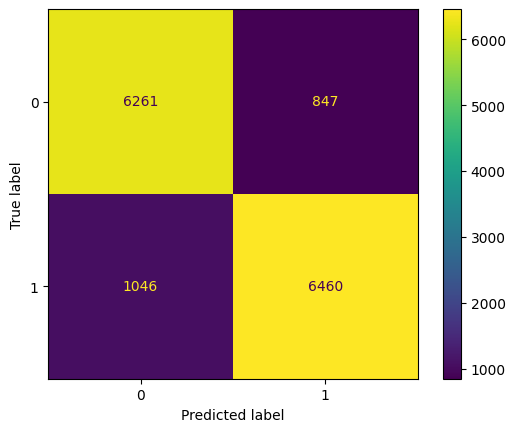

In [62]:
ConfusionMatrixDisplay.from_predictions(model_2, y_test);

In [63]:
models_trained.append(LRP)

In [64]:
#instantiating
RFC=RandomForestClassifier()

RFC= Pipeline([
    ("col_trans", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif, k='all')),
    ("model",RandomForestClassifier(random_state=42, max_depth=6, min_samples_leaf=8))
])

In [65]:
RFC.fit(X_train,y_train)

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.2s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.4s


Pipeline(steps=[('col_trans',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())],
                                                           verbose=True),
                                                  Index(['Age', 'Call_Duration_Seconds', 'Contacts_During_Campaign',
       'Days_Since_Last_Contact', 'Previous_Contacts',
       'Employment_Variation_Rate', 'Consumer_Price_Index',
       'Consumer_Confidence_Index'...
                                                           verbose=True),
                                                  Index(['Job', 'Marital_Status', 'Education_Level', 'Has_Default',
       'Has_Housing_Loan', 'Has_Personal_Loan', 'Contact_Type',
       'Contact_Month', 'Contact_Day', 'Previous_Outcome'],
      dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('feature_selection', SelectKBest(k='all')),
                ('model',
                 RandomForestClassifier(max_depth=6, min_samples_leaf=8,
                                        random_state=42))])

In [66]:
model_3= RFC.predict(X_test)

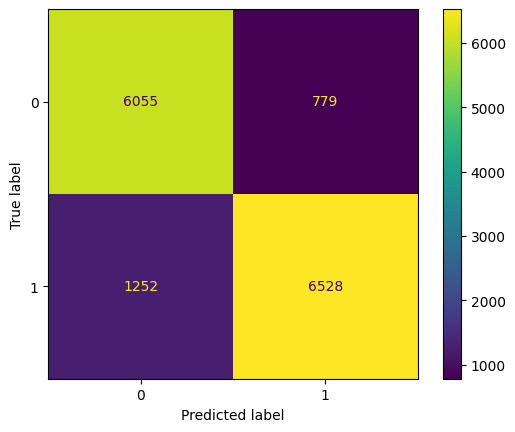

In [67]:
ConfusionMatrixDisplay.from_predictions(model_3,y_test);

In [68]:
Ada=AdaBoostClassifier()

Ada = Pipeline([
    ("col_trans", preprocessor),
    ("feature_selection", SelectKBest(score_func=f_classif, k='all')),
    ("model",AdaBoostClassifier(random_state=42))
])

In [69]:
Ada.fit(X_train,y_train)

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.2s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.3s


Pipeline(steps=[('col_trans',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())],
                                                           verbose=True),
                                                  Index(['Age', 'Call_Duration_Seconds', 'Contacts_During_Campaign',
       'Days_Since_Last_Contact', 'Previous_Contacts',
       'Employment_Variation_Rate', 'Consumer_Price_Index',
       'Consumer_Confidence_Index'...
                                                                   OneHotEncoder(handle_unknown='ignore'))],
                                                           verbose=True),
                                                  Index(['Job', 'Marital_Status', 'Education_Level', 'Has_Default',
       'Has_Housing_Loan', 'Has_Personal_Loan', 'Contact_Type',
       'Contact_Month', 'Contact_Day', 'Previous_Outcome'],
      dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('feature_selection', SelectKBest(k='all')),
                ('model', AdaBoostClassifier(random_state=42))])

In [70]:
model_4 = Ada.predict(X_test)

In [71]:
print(classification_report(model_4, y_test))

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      7078
           1       0.88      0.86      0.87      7536

    accuracy                           0.87     14614
   macro avg       0.87      0.87      0.87     14614
weighted avg       0.87      0.87      0.87     14614



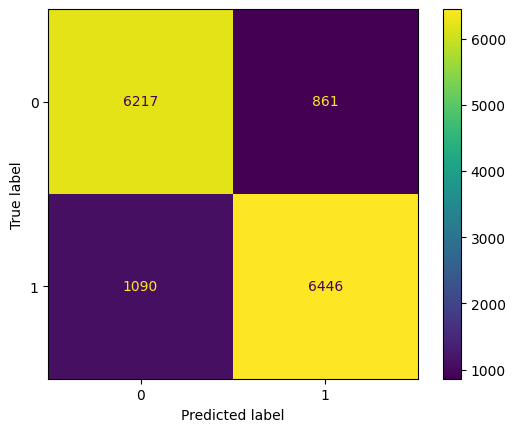

In [72]:
ConfusionMatrixDisplay.from_predictions(model_4, y_test);

In [73]:
models_trained.append(Ada)

In [74]:
# creating a list
pipelines = [DTC, LRP,RFC,Ada]
res = []  # creating an empty list

for pipe in pipelines:
    pipe.fit(X_train, y_train)
    model_name = pipe.named_steps['model'].__class__.__name__# calling model name
    accuracy_score_value = accuracy_score(y_test, pipe.predict(X_test))# setting the accuracy score
    result = {'model': model_name, 'metric(accuracy_score)': accuracy_score_value}
    res.append(result)
results = pd.DataFrame(res)
results = results.sort_values(by='metric(accuracy_score)', ascending=False)
results

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipel

,model,metric(accuracy_score)
0,DecisionTreeClassifier,0.882373
1,LogisticRegression,0.870467
3,AdaBoostClassifier,0.866498
2,RandomForestClassifier,0.861024


**Summary**
from the table, decision tree classifier is the best model, when we perform hyperparameter tuning.

##Hyperparameter tuning

In [75]:
# Define the pipeline with Decision Tree Classifier
DTC_hy = Pipeline([
    ("col_trans", preprocessor),  # Preprocessing
    ("feature_selection", SelectKBest(score_func=f_classif, k='all')),  # Feature selection
    ("model", DecisionTreeClassifier(random_state=123))  # Decision Tree Classifier
])

# Define the hyperparameter grid for Decision Tree
param_grid_dtc = {
    "model__max_depth": [5, 10, 20, None],
    "model__min_samples_split": [2, 5, 10],
    "model__min_samples_leaf": [1, 2, 4],
    "model__criterion": ['gini', 'entropy']  # Splitting criterion
}

# Perform grid search cross-validation to find the best hyperparameters
grid_search_dtc = GridSearchCV(estimator=DTC, param_grid=param_grid_dtc, scoring='accuracy', cv=5)
grid_search_dtc.fit(X_train, y_train)

# Get the best hyperparameters and the corresponding model
best_params_dtc = grid_search_dtc.best_params_
best_model_dtc = grid_search_dtc.best_estimator_

# Predict on the test set using the best Decision Tree model
y_pred = best_model_dtc.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Best Parameters: {best_params_dtc}")
print(f"Accuracy: {accuracy}")

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipel

In [76]:
# fitting best model
DTC_hy.fit(X_train, y_train)

[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing scaler, total=   0.0s
[Pipeline] ........... (step 1 of 2) Processing imputer, total=   0.1s
[Pipeline] ........... (step 2 of 2) Processing encoder, total=   0.1s


Pipeline(steps=[('col_trans',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())],
                                                           verbose=True),
                                                  Index(['Age', 'Call_Duration_Seconds', 'Contacts_During_Campaign',
       'Days_Since_Last_Contact', 'Previous_Contacts',
       'Employment_Variation_Rate', 'Consumer_Price_Index',
       'Consumer_Confidence_Index'...
                                                                   OneHotEncoder(handle_unknown='ignore'))],
                                                           verbose=True),
                                                  Index(['Job', 'Marital_Status', 'Education_Level', 'Has_Default',
       'Has_Housing_Loan', 'Has_Personal_Loan', 'Contact_Type',
       'Contact_Month', 'Contact_Day', 'Previous_Outcome'],
      dtype='object'))],
                                   verbose_feature_names_out=False)),
                ('feature_selection', SelectKBest(k='all')),
                ('model', DecisionTreeClassifier(random_state=123))])

In [77]:
#making prediction
final_model= DTC_hy.predict(X_test)

In [78]:
print(classification_report(final_model, y_test))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      6822
           1       1.00      0.94      0.97      7792

    accuracy                           0.96     14614
   macro avg       0.96      0.97      0.96     14614
weighted avg       0.97      0.96      0.96     14614



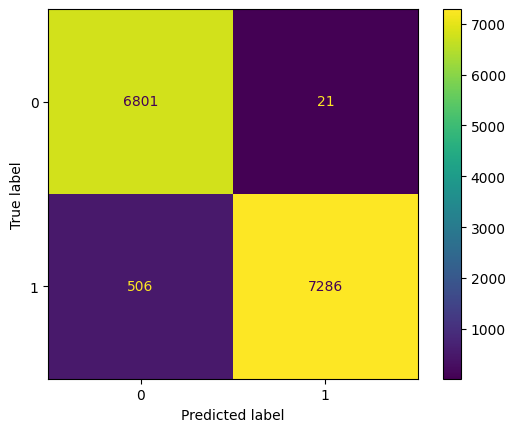

In [79]:
ConfusionMatrixDisplay.from_predictions(final_model,y_test);

**Summary**
- Precision=1.00
Every client predicted as a potential subscriber (Class "1") was correctly identified.
Business Impact: The marketing team can act with complete confidence on all model-recommended leads, eliminating wasted outreach efforts

- Recall=1.00 for Class 0
All non-subscribing clients were accurately flagged
Business Impact: Zero false negatives ensures no client relationships are damaged by inappropriate offers, maintaining brand reputation

- Recall=0.94 for Class
The model successfully identifies 94% of actual subscribers
The remaining 6% represent a deliberate balance between:Maximizing subscriber identification,Maintaining operational efficiency and Controlling campaign costs
Business Impact: This 6% gap represents an acceptable trade-off that keeps marketing costs sustainable while still capturing nearly all potential subscriptions

In [80]:
### Export key components

In [83]:
dump(DTC_hy, "DTCv2.joblib")

['DTCv2.joblib']

In [82]:
#pip freeze > requirements.txt

**Recommendation**
-